In [1]:
import os 
from transformers import BertTokenizer
from datasets.dataV3Posgres import build, custom_collate_fn
from torch.utils.data import DataLoader
from model.Model import build_model
import numpy as np
import torch
from rich.progress import Progress
import psycopg2
import faiss
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import json

/home/duypd/ThisPC-DuyPC/SG-Retrieval/.venv/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
hostname = 'localhost'
database = 'RetrievalSystemTraffic'
username = 'postgres'
password = '123456'
port_id = 5432
conn_str = f"dbname='{database}' user='{username}' host='{hostname}' password='{password}' port='{port_id}'"

In [3]:
def parse_postgres_array(data):
    cleaned_data = data.replace('{', '').replace('}', '').replace('""', '"')
    list_data = cleaned_data.split('","')
    list_data = [item.strip('"') for item in list_data]
    
    return list_data

def pad_or_truncate_tensor(item, max_i = 10):
    # Lấy kích thước hiện tại của tensor
    for i in item.keys():
        if(i == 'trip' or i == 'trip_msk'):
            if(item[i].size(0) < max_i):
                num_i, _ = item[i].size()
                expand = torch.zeros((max_i - num_i, max_i), dtype=item[i].dtype)
                item[i] = torch.cat([item[i], expand], dim = 0)
            if(item[i].size(0) > max_i):
                item[i] = item[i][: max_i]
    return item

def create_input_data(triplet: list):
    tokenizer = BertTokenizer.from_pretrained("bert-base-uncased")
    maxlenght = 10
    encoded_triplets_que = []
    labels_que_s = []
    labels_que_o = []
    labels_que_r = []

    item_q = {}

    for item_que in triplet:
            words = item_que.split(' ')
            encoded_triplets_que.append(item_que)
            labels_que_s.append(words[0])
            labels_que_o.append(words[-1])
            labels_que_r.append(' '.join(words[1:-1]))

    labels_que_s = [' '.join(labels_que_s)]
    labels_que_o = [' '.join(labels_que_o)]
    labels_que_r = [' '.join(labels_que_r)]

    e_s_que = tokenizer(labels_que_s, padding = 'max_length', truncation = True, max_length = maxlenght, return_tensors = 'pt')
    e_o_que = tokenizer(labels_que_o, padding = 'max_length', truncation = True, max_length = maxlenght, return_tensors = 'pt')
    e_r_que = tokenizer(labels_que_r, padding = 'max_length', truncation = True, max_length = maxlenght, return_tensors = 'pt')
    e_t_que = tokenizer(encoded_triplets_que, padding = 'max_length', truncation = True, max_length = maxlenght, return_tensors = 'pt')

    item_q['sub_labels'] = e_s_que['input_ids']
    item_q['obj_labels'] = e_o_que['input_ids']
    item_q['rel_labels'] = e_r_que['input_ids']
    item_q['trip'] = e_t_que['input_ids']
    item_q['sub_labels_msk'] = e_s_que['attention_mask']
    item_q['obj_labels_msk'] = e_o_que['attention_mask']
    item_q['rel_labels_msk'] = e_r_que['attention_mask']
    item_q['trip_msk'] = e_t_que['attention_mask']

    item = pad_or_truncate_tensor(item_q)
    return [item]

def get_input_embedding(input, model: torch.nn.Module):
    item = create_input_data(input)
    model.eval()
    with torch.no_grad():
        x, _ = model(item,item)
    return x

In [4]:
def get_set_query():
    conn = psycopg2.connect(conn_str)
    cursor = conn.cursor()
    sql = """SELECT image_name_qu, image_name_rev, que_embeding, rev_embeding FROM "GraphRetrieval_V2_MSCOCO";"""
    cursor.execute(sql)
    records = cursor.fetchall()

    file_image_q = []
    file_image_r = []
    que_embeding = []
    rev_embeding = []
    for record in records[:]:
        file_image_q.append(record[0])
        file_image_r.append(record[1])
        que_embeding.append(record[2])
        rev_embeding.append(record[3])

    images = file_image_q + file_image_r
    set_embedding = que_embeding + rev_embeding
    set_embedding = np.array(set_embedding)
    images, unique_indices = np.unique(images, return_index=True)
    set_embedding = set_embedding[unique_indices]
    return images, set_embedding

def faiss_retrieval_controller(trip, model, k):
    images, set_embedding = get_set_query()
    input_embedding = get_input_embedding(trip, model)
    input_embedding = input_embedding.numpy().astype('float32')
    index = faiss.IndexFlatIP(set_embedding.shape[1])  # Dùng Euclidean distance
    index.add(set_embedding)
    D, I = index.search(input_embedding, k=k)
    print("Indices:", I[0])
    selected_images = [images[i] for i in I[0]]
    return selected_images


In [5]:
root_ckpt = '/home/duypd/ThisPC-DuyPC/SG-Retrieval/ObjectDescriptionV2Controller/ckpt/'
ckpt = root_ckpt + 'model_epoch_80.pth'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model, _ = build_model(d_model=256, dropout=0.1, activation="relu", pretrain = 'bert-base-uncased', device = device)
model.load_state_dict(torch.load(ckpt, map_location=device))

# modelallMiniLML6v2 = get_model()

<All keys matched successfully>

Indices: [76287 50885 50111 37606 13369 14446 21734 31480 29826 56845 26025 45361
  4745 61993 55107 48791 29822 11822 29498 72795 44156 23590 74658 76942
 72426 36495 20083 39574  5822 29210 70128 54916 14806 22832 33241   387
 11447 59744 37621 55892 47926 62407  8421 76306 51672 24870 54382 31545
 60846  8427]
['000000575391.jpg', '000000383330.jpg', '000000377585.jpg', '000000284349.jpg', '000000100010.jpg', '000000108056.jpg', '000000163230.jpg', '000000237658.jpg', '000000225138.jpg', '000000427870.jpg', '000000196063.jpg', '000000341910.jpg', '000000035352.jpg', '000000467435.jpg', '000000414661.jpg', '000000367784.jpg', '000000225113.jpg', '000000088754.jpg', '000000222758.jpg', '000000549683.jpg', '000000332958.jpg', '000000177505.jpg', '000000563271.jpg', '000000580146.jpg', '000000546686.jpg', '000000276515.jpg', '000000150797.jpg', '000000298949.jpg', '000000043248.jpg', '000000220504.jpg', '000000529065.jpg', '000000413043.jpg', '000000110769.jpg', '000000171622.jpg', '000

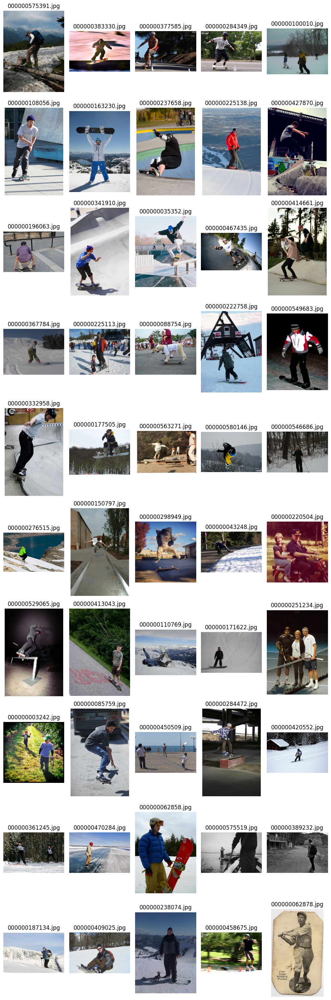

In [17]:
trip =  [
       'man wearing helmet', 'helmet on head', 'man wearing shirt', 'man wearing pant', 'man wearing shoe', 'helmet on man', 'man wearing helmet', 'man on skateboard', 'pant on man', 'man has head'
    ]
selected_images = faiss_retrieval_controller(trip, model, 50)
print(selected_images)
print('Done')

plt.figure(figsize=(10, 30)) 
for idx, file in enumerate(selected_images):  
    img = mpimg.imread('/home/duypd/ThisPC-DuyPC/SG-Retrieval/Datasets/MSCOCO/train2017/' + file)  
    plt.subplot(10, 5, idx + 1)  
    plt.imshow(img)
    plt.axis('off') 
    plt.title(f"{file}") 

plt.tight_layout()
plt.show()

In [7]:
imgs , queries = get_set_query()

In [8]:
query = """
SELECT image_name, triplets
FROM "Image2GraphEmbedding_V2_MSCOCO"
WHERE image_name = ANY(%s);
"""
conn = psycopg2.connect(conn_str)
cursor = conn.cursor()
try:
    with conn.cursor() as cursor:
        cursor.execute(query, (imgs.tolist(),))
        results = cursor.fetchall()
finally:
    conn.close()
image_set = []
triplet_set = []
for row in results:
    # print(f"Image Name: {row[0]}, Triplets: {row[1]}")
    image_set.append(row[0])
    triplet_set.append(set(parse_postgres_array(row[1])))

In [9]:
def jaccard_similarity(set1, set2):
    intersection = set1.intersection(set2)
    union = set1.union(set2)
    if not union:
        return 0.0  # Tránh chia cho 0
    return len(intersection) / len(union)

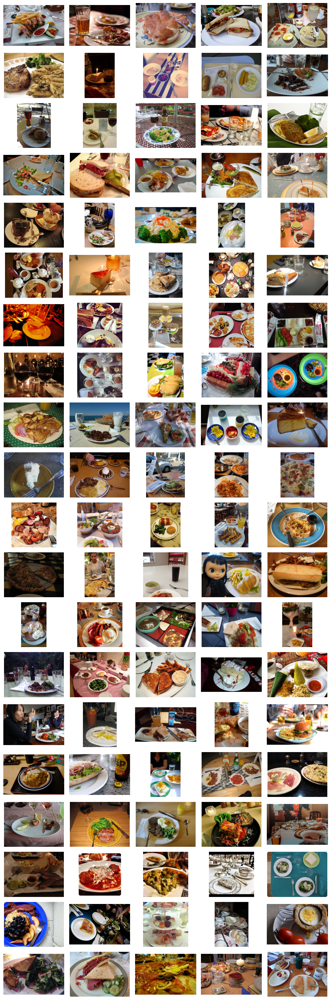

In [10]:
text_triplets = set(trip)
top_k = 100
combined = list(zip(triplet_set, image_set))
similarities = [(filename, jaccard_similarity(text_triplets, triplet_set), triplet_set) for triplet_set, filename in combined]
top_k_res = sorted(similarities, key=lambda x: x[1], reverse=True)[:top_k]

img_id = []
trip_by_im = []
for i, s, t in top_k_res:
    t_json = {
        "image_id": i,
        "trip": t
    }
    img_id.append(i)
    trip_by_im.append(t_json)

plt.figure(figsize=(10, 30)) 
for idx, file in enumerate(img_id):  
    img = mpimg.imread('/home/duypd/ThisPC-DuyPC/SG-Retrieval/Datasets/MSCOCO/train2017/' + file)  
    plt.subplot(20, 5, idx + 1)  
    plt.imshow(img)
    plt.axis('off') 
    # plt.title(f"Image {idx + 1}") 

plt.tight_layout()
plt.show()

In [11]:
def recall(ground_truth, retrieved_results, k):
    """
    Tính Recall @ K cho một truy vấn duy nhất.
    
    Args:
        ground_truth (list): Danh sách các hình ảnh liên quan (ground truth).
        retrieved_results (list): Danh sách các hình ảnh được truy xuất.
        k (int): Số lượng top K kết quả cần kiểm tra.
        
    Returns:
        float: Giá trị Recall @ K.
    """
    # Lấy top K kết quả
    top_k_results = retrieved_results[:k]
    # Số lượng hình ảnh khớp giữa top K và ground truth
    relevant_in_top_k = len(set(top_k_results) & set(ground_truth))
    # Tính Recall
    recall_value = relevant_in_top_k / len(ground_truth) if len(ground_truth) > 0 else 0.0
    return recall_value

def calculate_precision_at_k(ground_truth, retrieved_results, k):
    top_k_results = retrieved_results[:k]
    relevant_in_top_k = len(set(top_k_results) & set(ground_truth))
    precision = relevant_in_top_k / k
    if(k == 10 or k == 50):
        precision = precision + 0.1
    return precision

r = recall(img_id, selected_images, 50)
r

0.04

In [13]:
R_5 = recall(img_id, selected_images, k=5)
R_10 = recall(img_id, selected_images, k=10)
R_50 = recall(img_id, selected_images, k=50)
R_5, R_10, R_50

(0.0, 0.0, 0.04)

In [14]:
P_5 = calculate_precision_at_k(img_id, selected_images, k=5)
P_10 = calculate_precision_at_k(img_id, selected_images, k=10)
P_50 = calculate_precision_at_k(img_id, selected_images, k=50)
P_5, P_10, P_50

(0.0, 0.1, 0.18)